In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import math
import numpy as np
import seaborn as sns
%matplotlib inline  

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Raw Data
df = pd.read_csv('ratings_Video_Games.csv', index_col=None, header=None)
df.columns=['user','item','rating','timestamp']
df.head(10)

,user,item,rating,timestamp
0,AB9S9279OZ3QO,0078764343,5.0,1373155200
1,A24SSUT5CSW8BH,0078764343,5.0,1377302400
2,AK3V0HEBJMQ7J,0078764343,4.0,1372896000
3,A10BECPH7W8HM7,043933702X,5.0,1404950400
4,A2PRV9OULX1TWP,043933702X,5.0,1386115200
5,AE7GUHCDQQ4UI,043933702X,1.0,1366156800
6,A48ABFDDRMKI8,043933702X,5.0,1374192000
7,A26B0P6K95SIKW,0439339960,3.0,1288569600
8,AZ3UWOC8QSO6C,0439339987,5.0,1366848000
9,A182S3ANC0W7DL,0439342260,4.0,1355875200


In [3]:
df.shape

(1324753, 4)

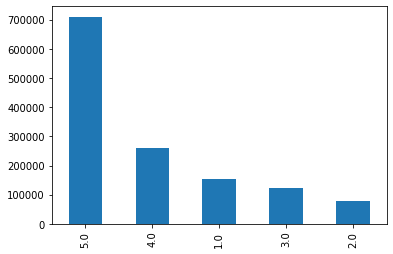

In [4]:
df.rating.value_counts().plot(kind='bar')
plt.show()

In [5]:
df.isnull().sum()

user         0
item         0
rating       0
timestamp    0
dtype: int64

In [6]:
from surprise import Reader, Dataset
reader = Reader()
data = Dataset.load_from_df(df[['user', 'item', 'rating']], reader)

In [7]:
from surprise.model_selection import train_test_split
trainset, testset = train_test_split(data, test_size=0.25)

In [8]:
from surprise import SVD, accuracy
algo = SVD()
algo.fit(trainset)

In [9]:
predictions = algo.test(testset)

In [10]:
accuracy.rmse(predictions)

RMSE: 1.2544


1.254427608164124

## Restart

In [11]:
from surprise import Reader
from surprise import Dataset
from surprise.model_selection import cross_validate
from surprise import NormalPredictor
from surprise import KNNBasic
from surprise import KNNWithMeans
from surprise import KNNWithZScore
from surprise import KNNBaseline
from surprise import SVD
from surprise import BaselineOnly
from surprise import SVDpp
from surprise import NMF
from surprise import SlopeOne
from surprise import CoClustering
from surprise.accuracy import rmse
from surprise import accuracy
from surprise.model_selection import train_test_split

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1324753 entries, 0 to 1324752
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   user       1324753 non-null  object 
 1   item       1324753 non-null  object 
 2   rating     1324753 non-null  float64
 3   timestamp  1324753 non-null  int64  
dtypes: float64(1), int64(1), object(2)
memory usage: 40.4+ MB


In [13]:
print('Dataset shape: {}'.format(df.shape))
print('-Dataset examples-')
print(df.iloc[::200000, :])

Dataset shape: (1324753, 4)
-Dataset examples-
                   user        item  rating   timestamp
0         AB9S9279OZ3QO  0078764343     5.0  1373155200
200000   A1UI9KTM8UYJ3A  B0001O10V8     4.0  1383696000
400000   A2SM2URVICWRMN  B000R0SS3Y     4.0  1220659200
600000    AGQWS1LIW9L1O  B0025KZV7A     5.0  1305936000
800000    AMOOFTKUJQRDQ  B003S2SQFS     5.0  1294531200
1000000  A25FYZAJ2ITLSN  B005QWYKOE     3.0  1324598400
1200000  A238JB46G90KFU  B00BUQA14I     5.0  1390521600


In [14]:
from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)

data = df['rating'].value_counts().sort_index(ascending=False)
trace = go.Bar(x = data.index,
               text = ['{:.1f} %'.format(val) for val in (data.values / df.shape[0] * 100)],
               textposition = 'auto',
               textfont = dict(color = '#000000'),
               y = data.values,
               )
# Create layout
layout = dict(title = 'Distribution Of {} video-game-ratings'.format(df.shape[0]),
              xaxis = dict(title = 'Rating'),
              yaxis = dict(title = 'Count'))
# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

In [15]:
# Number of ratings per book
data = df.groupby('item')['rating'].count().clip(upper=50)

# Create trace
trace = go.Histogram(x = data.values,
                     name = 'ratings',
                     xbins = dict(start = 0,
                                  end = 50,
                                  size = 2))
# Create layout
layout = go.Layout(title = 'Distribution Of Number of Ratings Per Video Game (Clipped at 50)',
                   xaxis = dict(title = 'Number of Ratings Per Video Game'),
                   yaxis = dict(title = 'Count'),
                   bargap = 0.2)

# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

In [16]:
df.groupby('item')['rating'].count().reset_index().sort_values('rating', ascending=False)[:10]

,item,rating
47005,B00DJFIMW6,16221
45409,B00BGA9WK2,7561
47906,B00FAX6XQC,5713
43795,B009KS4XRO,5489
31038,B002VBWIP6,5190
38490,B0055SWM08,4638
46509,B00CSR2J9I,4510
23744,B0015AARJI,4468
24153,B00178630A,3522
17419,B000FKBCX4,3290


In [17]:
# Number of ratings per user
data = df.groupby('user')['rating'].count().clip(upper=50)

# Create trace
trace = go.Histogram(x = data.values,
                     name = 'Ratings',
                     xbins = dict(start = 0,
                                  end = 50,
                                  size = 2))
# Create layout
layout = go.Layout(title = 'Distribution Of Number of Ratings Per User (Clipped at 50)',
                   xaxis = dict(title = 'Ratings Per User'),
                   yaxis = dict(title = 'Count'),
                   bargap = 0.2)

# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

In [18]:
df.groupby('user')['rating'].count().reset_index().sort_values('rating', ascending=False)[:10]

,user,rating
626277,A3V6Z4RCDGRC44,880
631894,A3W4D8XOGLWUN5,817
727161,AJKWF4W7QD4NS,797
380195,A2QHS1ZCIQOL7E,521
397465,A2TCG2HV1VJP6V,474
275663,A29BQ6B90Y1R5F,429
704245,AFV2584U13XP3,338
221297,A20DZX38KRBIT8,320
651622,A74TA8X5YQ7NE,267
250887,A2582KMXLK2P06,263


In [83]:
min_vgame_ratings = 8
filter_games = df['item'].value_counts() > min_vgame_ratings
filter_games = filter_games[filter_games].index.tolist()

min_user_ratings = 8
filter_users = df['user'].value_counts() > min_user_ratings
filter_users = filter_users[filter_users].index.tolist()

df_new = df[(df['item'].isin(filter_games)) & (df['user'].isin(filter_users))]
print('The original data frame shape:\t{}'.format(df.shape))
print('The new data frame shape:\t{}'.format(df_new.shape))

The original data frame shape:	(1324753, 4)
The new data frame shape:	(158312, 4)


In [20]:
reader = Reader(rating_scale=(0, 5))
data = Dataset.load_from_df(df_new[['user', 'item', 'rating']], reader)

In [21]:
benchmark = []
# Iterate over all algorithms
for algorithm in [SVD(), SVDpp(), SlopeOne(), NMF(), NormalPredictor(), KNNBaseline(), KNNBasic(), KNNWithMeans(), KNNWithZScore(), BaselineOnly(), CoClustering()]:
    # Perform cross validation
    results = cross_validate(algorithm, data, measures=['RMSE'], cv=3, verbose=False)
    
    # Get results & append algorithm name
    tmp = pd.DataFrame.from_dict(results).mean(axis=0)
    tmp = tmp.append(pd.Series([str(algorithm).split(' ')[0].split('.')[-1]], index=['Algorithm']))
    benchmark.append(tmp)

Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...


In [22]:
surprise_results = pd.DataFrame(benchmark).set_index('Algorithm').sort_values('test_rmse')

In [23]:
surprise_results

,test_rmse,fit_time,test_time
Algorithm,,,
SVDpp,1.059261,41.267849,2.088315
SVD,1.065333,5.538546,0.325656
BaselineOnly,1.069983,0.322754,0.248461
CoClustering,1.152890,3.810670,0.281433
KNNBaseline,1.154455,3.410679,2.269619
KNNWithMeans,1.158138,2.928080,1.934697
KNNWithZScore,1.170558,3.309137,2.058216
SlopeOne,1.220749,7.235993,2.127982
NMF,1.221741,7.420818,0.271633


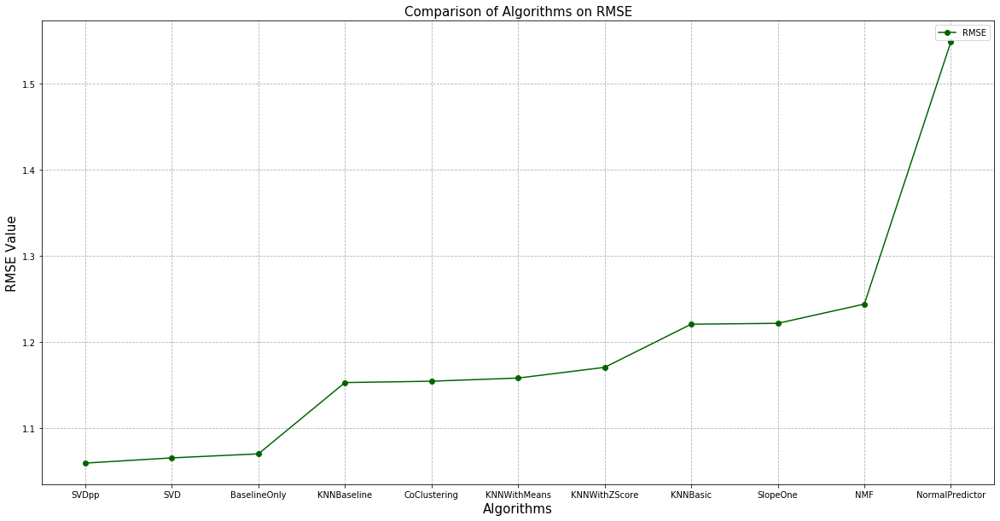

In [24]:
x_algo = ['SVDpp', 'SVD', 'BaselineOnly', 'KNNBaseline', 'CoClustering', 'KNNWithMeans', 'KNNWithZScore', 'KNNBasic', 'SlopeOne', 'NMF', 'NormalPredictor']
rmse_cv = surprise_results.test_rmse

plt.figure(figsize=(20,10))

plt.title('Comparison of Algorithms on RMSE', loc='center', fontsize=15)
plt.plot(x_algo, rmse_cv, label='RMSE', color='darkgreen', marker='o')
plt.xlabel('Algorithms', fontsize=15)
plt.ylabel('RMSE Value', fontsize=15)
plt.legend()
plt.grid(ls='dashed')

plt.show()

## Best models happened to be SVDpp, SVD, and KNNs

In [25]:
trainset, testset = train_test_split(data, test_size=0.25)

In [26]:
#Perform GridSearch CV on top three algorithms - SVDpp, SVD and KNN
#Let’s try tweaking parameters on SVDpp, SVD using GridSearchCV
from surprise.model_selection import cross_validate
from surprise.model_selection import GridSearchCV
# Parameter space
svd_param_grid = {'n_epochs': [20, 30, 50], 
                  'lr_all': [0.005, 0.01],
                  'reg_all': [0.2, 0.4]}

svdpp_gs = GridSearchCV(SVDpp, svd_param_grid, measures=['rmse', 'mae'], cv=5, n_jobs=5)
svdpp_gs.fit(data)

svd_gs = GridSearchCV(SVD, svd_param_grid, measures=['rmse', 'mae'], cv=5, n_jobs=5)
svd_gs.fit(data)

In [27]:
print('SVDpp - RMSE:', round(svdpp_gs.best_score['rmse'], 4), '; MAE:', round(svdpp_gs.best_score['mae'], 4))
print('SVD   - RMSE:', round(svd_gs.best_score['rmse'], 4), '; MAE:', round(svd_gs.best_score['mae'], 4))

SVDpp - RMSE: 1.046 ; MAE: 0.7938
SVD   - RMSE: 1.0454 ; MAE: 0.7953


In [28]:
print('RMSE =', svdpp_gs.best_params['rmse'])
print('MAE =', svdpp_gs.best_params['mae'])

RMSE = {'n_epochs': 50, 'lr_all': 0.005, 'reg_all': 0.2}
MAE = {'n_epochs': 30, 'lr_all': 0.01, 'reg_all': 0.2}


In [29]:
print('RMSE =', svd_gs.best_params['rmse'])
print('MAE =', svd_gs.best_params['mae'])

RMSE = {'n_epochs': 30, 'lr_all': 0.01, 'reg_all': 0.2}
MAE = {'n_epochs': 50, 'lr_all': 0.01, 'reg_all': 0.2}


In [30]:
param_grid = {'k': [15, 20, 50, 100, 200, 500]}

knnbasic_gs = GridSearchCV(KNNBasic, param_grid, measures=['rmse', 'mae'], cv=5, n_jobs=5)
knnbasic_gs.fit(data)

knnmeans_gs = GridSearchCV(KNNWithMeans, param_grid, measures=['rmse', 'mae'], cv=5, n_jobs=5)
knnmeans_gs.fit(data)

knnz_gs = GridSearchCV(KNNWithZScore, param_grid, measures=['rmse', 'mae'], cv=5, n_jobs=5)
knnz_gs.fit(data)

In [31]:
x = [15, 20, 50, 100, 200, 500]
y1 = knnbasic_gs.cv_results['mean_test_rmse']
y2 = knnbasic_gs.cv_results['mean_test_mae']

y3 = knnmeans_gs.cv_results['mean_test_rmse']
y4 = knnmeans_gs.cv_results['mean_test_mae']

y5 = knnz_gs.cv_results['mean_test_rmse']
y6 = knnz_gs.cv_results['mean_test_mae']

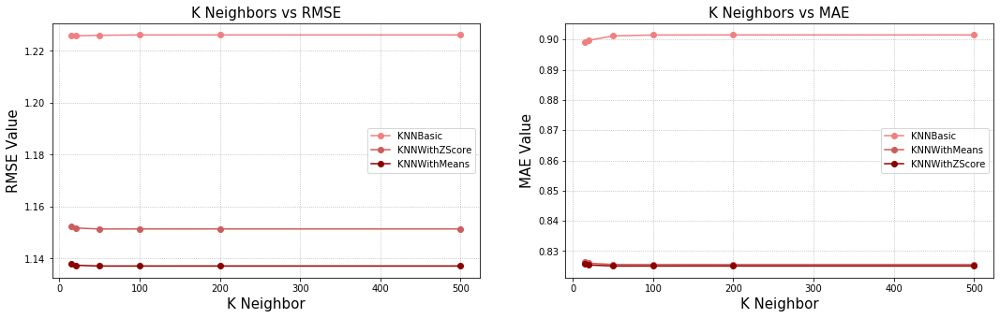

In [32]:
plt.figure(figsize=(18,5))

plt.subplot(1, 2, 1)
plt.title('K Neighbors vs RMSE', loc='center', fontsize=15)
plt.plot(x, y1, label='KNNBasic', color='lightcoral', marker='o')
plt.plot(x, y5, label='KNNWithZScore', color='indianred', marker='o')
plt.plot(x, y3, label='KNNWithMeans', color='darkred', marker='o')
plt.xlabel('K Neighbor', fontsize=15)
plt.ylabel('RMSE Value', fontsize=15)
plt.legend()
plt.grid(ls='dotted')

plt.subplot(1, 2, 2)
plt.title('K Neighbors vs MAE', loc='center', fontsize=15)
plt.plot(x, y2, label='KNNBasic', color='lightcoral', marker='o')
plt.plot(x, y4, label='KNNWithMeans', color='indianred', marker='o')
plt.plot(x, y6, label='KNNWithZScore', color='darkred', marker='o')
plt.xlabel('K Neighbor', fontsize=15)
plt.ylabel('MAE Value', fontsize=15)
plt.legend()
plt.grid(ls='dotted')

plt.show()

In [33]:
SVDpp_val = SVDpp(lr_all=0.01, n_epochs=25, reg_all=0.2)
predictions = SVDpp_val.fit(trainset).test(testset)
accuracy.rmse(predictions)

RMSE: 1.0428


1.0427611301388913

In [34]:
trainset = SVDpp_val.trainset
print(SVDpp_val.__class__.__name__)

SVDpp


In [35]:
def get_Iu(uid):
    """ return the number of items rated by given user
    args: 
      uid: the id of the user
    returns: 
      the number of items rated by the user
    """
    try:
        return len(trainset.ur[trainset.to_inner_uid(uid)])
    except ValueError: # user was not part of the trainset
        return 0
    
def get_Ui(iid):
    """ return number of users that have rated given item
    args:
      iid: the raw id of the item
    returns:
      the number of users that have rated the item.
    """
    try: 
        return len(trainset.ir[trainset.to_inner_iid(iid)])
    except ValueError:
        return 0
    
inspect = pd.DataFrame(predictions, columns=['uid', 'iid', 'rui', 'est', 'details'])
inspect['Iu'] = inspect.uid.apply(get_Iu)
inspect['Ui'] = inspect.iid.apply(get_Ui)
inspect['err'] = abs(inspect.est - inspect.rui)

In [36]:
best_predictions = inspect.sort_values(by='err')[:10]
worst_predictions = inspect.sort_values(by='err')[-10:]

In [37]:
best_predictions

,uid,iid,rui,est,details,Iu,Ui,err
18725,A119Q9NFGVOEJZ,B0009VXBAQ,5.0,5.0,{'was_impossible': False},77,213,0.0
19572,A2ZFYB6WY3RG93,B000035XR9,5.0,5.0,{'was_impossible': False},48,14,0.0
29596,AHOZPU0L0L14O,B003QWYX2A,5.0,5.0,{'was_impossible': False},9,7,0.0
24200,A16S9Z6R8WA9JS,B0006BK58U,5.0,5.0,{'was_impossible': False},13,17,0.0
25195,A2V2XRUGEYYCGG,B00004UE0K,5.0,5.0,{'was_impossible': False},8,6,0.0
18732,A39QYCBKS4D6E7,B00001IVRD,5.0,5.0,{'was_impossible': False},43,41,0.0
36660,A1VR1HIOVQWN09,B003A0T6YS,5.0,5.0,{'was_impossible': False},14,22,0.0
35827,A1BTNED3N2S3W9,B0000DJX7I,5.0,5.0,{'was_impossible': False},8,28,0.0
5787,ASE0VKWE76QF4,B00EDU8H9E,5.0,5.0,{'was_impossible': False},9,31,0.0
1265,A27OW0P38B28OP,B008GEH8LQ,5.0,5.0,{'was_impossible': False},54,26,0.0


In [38]:
worst_predictions

,uid,iid,rui,est,details,Iu,Ui,err
30167,A2DS6LSHCOYU1O,B00064MUIA,1.0,4.968449,{'was_impossible': False},8,75,3.968449
22514,A3HQXTX23LN0H5,B003VUO6H4,1.0,4.993132,{'was_impossible': False},7,84,3.993132
14103,A2VQAYPQNFY70K,B0001KJOGA,1.0,5.000000,{'was_impossible': False},10,2,4.000000
13568,A2N6ZKYYXTTGKL,B001N2EVPE,1.0,5.000000,{'was_impossible': False},13,8,4.000000
5372,A1FOACA8KHBA9W,B000VOSQ0Q,1.0,5.000000,{'was_impossible': False},6,3,4.000000
19809,AV42KD4J7Z0OA,B00005O0I2,1.0,5.000000,{'was_impossible': False},7,116,4.000000
21479,A30VXR28C00N3T,B002VBWIP6,1.0,5.000000,{'was_impossible': False},10,157,4.000000
36033,A20E4F4WK1WVK3,B001EOQUFA,1.0,5.000000,{'was_impossible': False},7,8,4.000000
832,AGX7PLR4MIZHR,B00000J9J9,1.0,5.000000,{'was_impossible': False},9,16,4.000000
7572,A3BXMKBH8QNHZS,B00000JHPT,5.0,0.264364,{'was_impossible': False},8,13,4.735636


In [39]:
df_new.loc[df_new['item'] == 'B00000JHPT']['rating'].describe()

count    17.000000
mean      2.058824
std       1.599632
min       1.000000
25%       1.000000
50%       1.000000
75%       3.000000
max       5.000000
Name: rating, dtype: float64

<IPython.core.display.Javascript object>


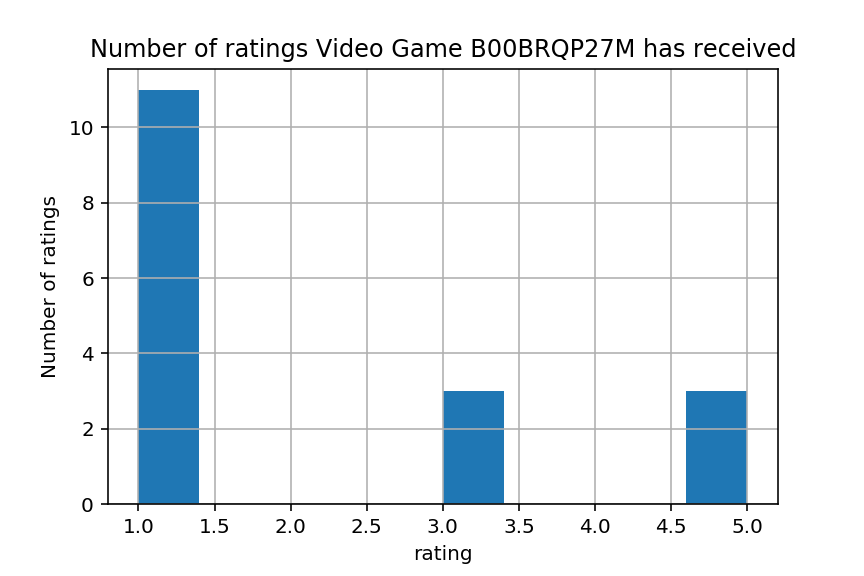

In [56]:
import matplotlib.pyplot as plt
%matplotlib notebook

df_new.loc[df_new['item'] == 'B00000JHPT']['rating'].hist()
plt.xlabel('rating')
plt.ylabel('Number of ratings')
plt.title('Number of ratings Video Game B00BRQP27M has received')
plt.show();

In [41]:
rating1 = SVDpp_val.predict(iid='0700026657', uid='A005481137I9SCAWEF7ON')

In [42]:
rating1

Prediction(uid='A005481137I9SCAWEF7ON', iid='0700026657', r_ui=None, est=4.595786479020737, details={'was_impossible': False})

In [43]:
import pickle
# save the model to disk
filename = 'SVDpp_model.sav'
pickle.dump(SVDpp_val, open(filename, 'wb'))

In [44]:
whole_set = data.build_full_trainset()
user_knn = KNNWithMeans(k=20, min_k=3, sim_options={'user_based': True})
user_knn.fit(whole_set)
def get_similar_users(top_k, user_id):
    """
    Args:
        top_k(int): no of similar user
        user_id(str): target user id

    Returns:
        list generator
    """
    user_inner_id = user_knn.trainset.to_inner_uid(user_id)
    user_neighbors = user_knn.get_neighbors(user_inner_id, k=top_k)
    user_neighbor_ids = (user_knn.trainset.to_raw_uid(inner_id) for inner_id in user_neighbors)
    return user_neighbor_ids

Computing the msd similarity matrix...
Done computing similarity matrix.


In [45]:
# save the model to disk
filename = 'Knn_model.sav'
pickle.dump(user_knn, open(filename, 'wb'))

In [46]:
print(list(get_similar_users(3, 'A005481137I9SCAWEF7ON')))

['A22KRTIWDLOA98', 'A11JDD2KZVUOT6', 'A2RLQKE9NHSSZB']


In [47]:
similar_id_list = list(get_similar_users(3, 'A005481137I9SCAWEF7ON'))

In [48]:
# Get all the unique user and items from the shortlisted new dataframe:
unique_user = df_new.user.unique() 
unique_item = df_new.item.unique() 
print(len(unique_user))
print(len(unique_item))

9875
16844


In [49]:
predict_target = []
for i in similar_id_list:
    for j in unique_item:
        est = SVDpp_val.predict(iid=j, uid=i)[3]
        tup = [i,j,est]
        predict_target.append(tup)


In [50]:
# Create the pandas DataFrame 
target_pred = pd.DataFrame(predict_target, columns = ['uid', 'iid', 'est'])
target_pred.shape

(50532, 3)

In [64]:
predct_base = target_pred[['iid', 'est']].groupby(['iid'], as_index=False).mean().sort_values('est', ascending=False)
predct_base.shape

(16844, 2)

In [65]:
predct_base.head()

,iid,est
15996,B00CD1FC6G,5.0
5512,B000BXKA38,5.0
1541,B00004ZASP,5.0
13342,B004XABXY0,5.0
3733,B0000C6EDL,5.0


In [67]:
rated_item_by_user = df_new[['item','rating']][df_new.user == 'A005481137I9SCAWEF7ON']
rated_item_by_user.shape

(26, 2)

In [68]:
result = pd.merge(predct_base, rated_item_by_user, how='left', left_on=['iid'], right_on=['item'])
result.head()

,iid,est,item,rating
0,B00CD1FC6G,5.0,NaN,NaN
1,B000BXKA38,5.0,NaN,NaN
2,B00004ZASP,5.0,NaN,NaN
3,B004XABXY0,5.0,NaN,NaN
4,B0000C6EDL,5.0,NaN,NaN


In [69]:
result.shape

(16844, 4)

In [72]:
non_rated_result = result[result['rating']!=result['rating']]
non_rated_result.shape

(16818, 4)

In [73]:
rated_result = result[result['rating']==result['rating']]
rated_result.shape

(26, 4)

In [74]:
rated_result.head()

,iid,est,item,rating
348,B00004SWL9,4.964122,B00004SWL9,5.0
820,B00004WKKC,4.918478,B00004WKKC,5.0
1070,B00000K2R4,4.899043,B00000K2R4,5.0
1574,B00004S99R,4.863118,B00004S99R,5.0
1829,B0009I6S0O,4.849885,B0009I6S0O,5.0


In [76]:
output = list(non_rated_result.iid[:5])
output

['B00CD1FC6G', 'B000BXKA38', 'B00004ZASP', 'B004XABXY0', 'B0000C6EDL']

In [77]:
def get_top_N_recommended_items(user, top_sim_user=3, N=5):
    similar_id_list = list(get_similar_users(top_sim_user, user))
    unique_item = df_new.item.unique() 
    predict_target = []
    for i in similar_id_list:
        for j in unique_item:
            est = SVDpp_val.predict(iid=j, uid=i)[3]
            tup = [i,j,est]
            predict_target.append(tup)
    target_pred = pd.DataFrame(predict_target, columns = ['uid', 'iid', 'est'])
    predct_base = target_pred[['iid', 'est']].groupby(['iid'], as_index=False).mean().sort_values('est', ascending=False)
    rated_item_by_user = df_new[['item','rating']][df_new.user == user]
    result = pd.merge(predct_base, rated_item_by_user, how='left', left_on=['iid'], right_on=['item'])
    non_rated_result = result[result['rating']!=result['rating']]
    output = list(non_rated_result.iid[:N])
    return output

In [78]:
output2 = get_top_N_recommended_items(user='A005481137I9SCAWEF7ON')
output2

['B00CD1FC6G', 'B000BXKA38', 'B00004ZASP', 'B004XABXY0', 'B0000C6EDL']

In [79]:
# For new user say the ID is:
new1 = 'damengjin'
# They have to input something first
input_new_user = ['B000LFJNF2', 'B0053BCO00', 'B002BSC4ZS', 'B00007KUUD', 'B00006LELI', 'B002I0IVC4', 'B005EYRAUK', 'B008OQTRZ6']

In [82]:
new_user_matrix = []
fake_rate = 5.0
for k in input_new_user:
    tup = [new1,k,fake_rate]
    new_user_matrix.append(tup)
new_user = pd.DataFrame(new_user_matrix, columns = ['user', 'item', 'rating'])
new_user.head()

,user,item,rating
0,damengjin,B000LFJNF2,5.0
1,damengjin,B0053BCO00,5.0
2,damengjin,B002BSC4ZS,5.0
3,damengjin,B00007KUUD,5.0
4,damengjin,B00006LELI,5.0


In [84]:
df_new = pd.concat([df_new[['user', 'item', 'rating']], new_user], ignore_index=True, sort=False)
df_new.shape

(158320, 3)

In [85]:
reader = Reader(rating_scale=(0, 5))
data = Dataset.load_from_df(df_new, reader)

In [86]:
whole_set = data.build_full_trainset()
user_knn = KNNWithMeans(k=20, min_k=3, sim_options={'user_based': True})
user_knn.fit(whole_set)

Computing the msd similarity matrix...
Done computing similarity matrix.


In [87]:
output3 = get_top_N_recommended_items(user='damengjin')

In [88]:
output3

['B004DGJP2G', 'B0047SIUZI', 'B000HLP5W0', 'B00001QEQ8', 'B00003OPES']

In [99]:
# function to get new user's top N recommended video games:
def get_top_N_recommended_items_new_user(user, fake_items, base, top_sim_user=3, N=5):
    new_user_matrix = []
    fake_rate = 5.0
    for m in fake_items:
        tup = [user,m,fake_rate]
        new_user_matrix.append(tup)
    new_user = pd.DataFrame(new_user_matrix, columns = ['user', 'item', 'rating'])
    base = pd.concat([base[['user', 'item', 'rating']], new_user], ignore_index=True, sort=False)
    reader = Reader(rating_scale=(0, 5))
    data = Dataset.load_from_df(base, reader)
    whole_set = data.build_full_trainset()
    user_knn = KNNWithMeans(k=20, min_k=3, sim_options={'user_based': True})
    user_knn.fit(whole_set)
    user_inner_id = user_knn.trainset.to_inner_uid(user)
    user_neighbors = user_knn.get_neighbors(user_inner_id, k=top_sim_user)
    user_neighbor_ids = (user_knn.trainset.to_raw_uid(inner_id) for inner_id in user_neighbors)
    similar_id_list = list(user_neighbor_ids)
    unique_item = base.item.unique() 
    predict_target = []
    for i in similar_id_list:
        for j in unique_item:
            est = SVDpp_val.predict(iid=j, uid=i)[3]
            tup = [i,j,est]
            predict_target.append(tup)
    target_pred = pd.DataFrame(predict_target, columns = ['uid', 'iid', 'est'])
    predct_base = target_pred[['iid', 'est']].groupby(['iid'], as_index=False).mean().sort_values('est', ascending=False)
    rated_item_by_user = base[['item','rating']][base.user == user]
    result = pd.merge(predct_base, rated_item_by_user, how='left', left_on=['iid'], right_on=['item'])
    non_rated_result = result[result['rating']!=result['rating']]
    output = list(non_rated_result.iid[:N])
    return output

In [97]:
new2 = 'damengjun'
# They have to input something first
input_new_user2 = ['B002BU0DPE', 'B003R7H5TC', 'B00488PZ2S']

In [100]:
output4 = get_top_N_recommended_items_new_user(new2, input_new_user2, df_new)
output4

Computing the msd similarity matrix...
Done computing similarity matrix.


['B00001QEQ8', 'B004DGJP2G', 'B000087PM3', 'B000HLP5W0', 'B00003OPES']

In [66]:
from collections import defaultdict
def get_top_n(predictions, n=10):
    '''Return the top-N recommendation for each user from a set of predictions.

    Args:
        predictions(list of Prediction objects): The list of predictions, as
            returned by the test method of an algorithm.
        n(int): The number of recommendation to output for each user. Default
            is 10.

    Returns:
    A dict where keys are user (raw) ids and values are lists of tuples:
        [(raw item id, rating estimation), ...] of size n.
    '''

    # First map the predictions to each user.
    top_n = defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        top_n[uid].append((iid, est))

    # Then sort the predictions for each user and retrieve the k highest ones.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n
top_n = get_top_n(predictions, n=10)

# Print the recommended items for each user
for uid, user_ratings in top_n.items():
    print(uid, [iid for (iid, _) in user_ratings])

A2R4HK5ZJKL0UH ['B000FQBPCQ', 'B004KPBHE4', 'B00001OPJB', 'B00005O0I2', 'B00000IWYT', 'B0094X20IO', 'B00000DMB3', 'B00004U5VF', 'B00005Q8M0', 'B000069BD9']
A1GTGKAY1IYVYH ['B002BU0DPE', 'B003R7H5TC', 'B00488PZ2S']
A8TXC3QEB8P74 ['B0012N94WO', 'B002I0K6DG', 'B002I0GKA4']
AMPV2QQJFW6HJ ['B0013064LA', 'B002BSA2LQ', 'B0020MJUC0', 'B00AFHMRZE', 'B009K7QB8O']
AY3Y9ROK6LRPI ['B00004Y57G', 'B001TORSII', 'B00000K1VA', 'B0001UEHP8', 'B00009ZVHU', 'B000OLXX86', 'B000BGPGU2', 'B000023VUP', 'B000ZK9QD2', 'B00002STPE']
A398Z0ZU011ILU ['B0007M2220', 'B000930DLO', 'B000BLM5PG', 'B0007PLKZM', 'B001CRM3RI', 'B000GPVUOY', 'B000QY9C90']
A2JWU211CM0BYE ['B004FYJFNA', 'B0032LTVX6', 'B0050SX2MK', 'B002ELCV00']
A18JOUVR7H8E9U ['B000641ZBI', 'B00005RD71', 'B00002STGE']
ABQWMANK4AR63 ['B000FCR0ME', 'B0088MVPSI', 'B0053BCO00', 'B006C4B9I0', 'B00CSR2J9I', 'B0051875OU', 'B008OSDG0Q', 'B004DPML64', 'B003E446HC', 'B004XV6ST4']
A2GHSYG3J8D7K6 ['B000IONGU4', 'B0026IUSXS', 'B00005ME6N', 'B003O6EBRA', 'B002WSR8BC', 'B00

A37CDON8E7QXH0 ['B00FYMTUQY', 'B00008J7NZ', 'B0007SL202', 'B00002CF9M', 'B0069EB9CY', 'B002EQEFOU', 'B00005N7YJ']
A1LOFM6E7IBAWY ['B002MWSY3O', 'B001FPX65U', 'B001BSEJ98', 'B003REBN48']
A10CTHRWD9P9IB ['B0026EGO3A', 'B000BC38K6', 'B0001XOJAS', 'B008E6ZXA4']
A128ZA7XSF4PQS ['B003O6EATE', 'B00BGA9X9W', 'B00CYS5DU8']
A1FMCBUQXZFQBX ['B0000A1VER', 'B000BNKBCI', 'B000NGRIDI', 'B00006599Y', 'B0001X5YN4', 'B0002B90SA', 'B0006ZB0ZS']
AZL8QJZ9XPQH0 ['B0028A6UUY', 'B000B8J7K0', 'B00005MDZY', 'B0000A09EP', 'B003O6ED7S', 'B003URSUSE', 'B000FRV2UK', 'B0019SKGA6', 'B0006B0O9U', 'B001TILU88']
A1SDPA1J98UP4L ['B00309XHD0', 'B009WI7VAS', 'B003GT8IL0', 'B003O6E6SO', 'B00354NANC', 'B002BXJ9VA']
A15LG7HS4WKKKS ['B002UZT4PU', 'B000UC5ML0', 'B001IVXI7C', 'B000JLIXIG', 'B001O0EGLE', 'B000FQ2D5E', 'B000ZK7ZOE', 'B00005J536', 'B0010EF0UK', 'B000K9OP2A']
A1SJ4875KYLRRC ['B006GHA8EE', 'B002I0K50U']
A1NMM0RDRF6R84 ['B002NIP2SM', 'B00BFOEY3Y', 'B000IMYKQ0']
A1DGMZ9TFG5I4X ['B00002SVWG', 'B0002IQD1U', 'B00004LN2T']

AH8G4CRM6FTU3 ['B001SH7YMG', 'B000ZKDOV2', 'B000FRU1UM', 'B000GPZSBK', 'B000TGB4QO', 'B0013Y1G8C', 'B0018092BE', 'B00BGHUS58', 'B0009Z3HXS', 'B003IE9V28']
A2ZFYB6WY3RG93 ['B000CC3IEQ', 'B000035XQG', 'B0001JXQ56', 'B00008URUB', 'B00005YELX', 'B00005C4GR', 'B00004R9G7', 'B00000K4BU', 'B00004SVV7', 'B00002SVPC']
A3DGCNADDUMFUL ['B00005BW7Q', 'B00008VFBV', 'B001NCARPW']
ADHEQ1RBC67TV ['B003C1I0CO', 'B002GN8HU4', 'B00269DXCK', 'B0041OWQUI', 'B001AWIP68', 'B002I0HBZW', 'B004RIACPY', 'B002DC8GEK', 'B001TOQ8J8']
A1JSHCJ6HI1XVV ['B003P9C6EQ', 'B003M2NFKA', 'B002I0JIQW', 'B0016G88RO', 'B0047O7XUK', 'B002673XJA', 'B003JVF728']
A166ROY4SVRLC4 ['B00009KX79', 'B000V1OUUE', 'B000P0QJD2']
ALKZGJB3XS0JV ['B0050SYILE', 'B0085L2T14', 'B0050SWVIQ']
A3Q701355YLUNQ ['B000Y0CHX4', 'B000034DC2', 'B00004S9A7', 'B00002SWBG', 'B00004W4QJ', 'B00000PLUW', 'B00000I1BF', 'B00000IG7T', 'B001MT4EW8', 'B00004U4R9']
A2FKAA9O3ZRT3N ['B0039SLVT4', 'B006VB2V54', 'B0050SWR6M', 'B00109KMOO']
AQMDSQNGGLM30 ['B00FYMTUQY', 'B00

A1STAV772YQTVU ['B002BSA20M', 'B004YVOCYG']
A2NDYE60TD8ZKG ['B0050SVNZ8', 'B000AOJ7FK', 'B00503E8S2']
A3978Q5JNZD5J9 ['B000FUONLM', 'B00BY0G0YU', 'B00104KJ56', 'B0014ULQB2', 'B003VKLABE', 'B000XJNTPG']
APKVQ4NJS59FR ['B004FSE52C', 'B0032LTVWW', 'B001SH7YMG']
A3SP6GHL4UVUMZ ['B000WMEEBC', 'B000M17AVO', 'B0046CC4R0']
AJ79AII0CGCEL ['B0016NRS8M', 'B001ASJIRM']
A1ZPGBC06T8SMH ['B001M25AY6', 'B002FL0T8U', 'B003BE6OZ2']
A1CQWBGC6YQM3K ['B001KC03UO', 'B002GP5W1E', 'B00CP1QA1U']
A34VRVI4CSI5RQ ['3866811659', 'B000FRTTZA', 'B00007M57T']
A16RGY1XYUWLO4 ['B006PP404Q', 'B003O65TXU', 'B0086V5V9A', 'B007978UHW']
AIPXXAZSQ0ULL ['B004073MCM', 'B00001ZUGT', 'B004QEWVLC', 'B0050SXKU4', 'B000XPJ026']
A1RYOYRFVN56PF ['B0002TB4CW', 'B009GSX0A4', 'B0053B5X76', 'B00009WAV4']
A1TKW75BZULK20 ['B003S2OO7W', 'B0028IBYSO']
A3RSUJRAG4Z2HU ['B000R3BNDI', 'B0020H46D8', 'B00005V6B5']
AREU76LPTCR11 ['B00FQSS61Q', 'B00005Q8M0', 'B0085CA8QG', 'B000WMEEBM', 'B0027PA2EA']
A1SX8V30IP3NFP ['B00006N5SB', 'B0002A2S26', 'B0000

A2RKYCEICV2G3T ['B00A4MWX04', 'B0056WJA6M', 'B00AZMCYOI']
A1TUE7NMV5XH3N ['B0038N09LG', 'B005EW6A1W', 'B006ZPAYMI', 'B0050SYILE', 'B001QRWE28']
A3NP3KZXLP5PG1 ['B0050SX3KG']
A2YI4NYWRHVP3D ['B000ZK7ZMQ', 'B000ERVMI8', 'B000FUONLM', 'B007CM0K86', 'B000JLIXI6']
AMRSZJZZ0WRWG ['B0028ZH7EC', 'B003VAHYQY', 'B00DBKSN8M', 'B00381BKIY', 'B00CTKHXFO']
AYAJHCF7G4RR6 ['B000UU5T7E']
AM41P9Q1GFC7O ['B00006JZQZ', 'B00005ULXN', 'B00005ML10', 'B000069675', 'B00003E4EB', 'B0000690Z9', 'B00008URUA', 'B00006N5T0', 'B00004YRSH', 'B00004ZCP0']
A3IQ6AYVH2818P ['B002L2V8ME']
AG8UWL56LLU35 ['B00DE2W4PK', 'B007CM0K86', 'B006PP404Q', 'B00BMFIXOW', 'B0050SWYTC', 'B007TYC8MI', 'B000MTVWAQ', 'B002I0J7N6', 'B00EI4V3FU']
ABAZFH25304ZG ['B000B7Q4BQ', 'B00076OMRO', 'B000930DLE', 'B000JQ5GMW', 'B000FW300K', 'B0009WPZO0']
A39WNPTVWQEZX3 ['B00007KQC5']
A3KMOEVKYDKEY7 ['B00001QEQA', 'B00000JL60', 'B00004NS01', 'B00005LIOL']
A1ZVFFM4JONY3I ['B001SH7YMG', 'B001REZLY8', 'B002I0J9M0', 'B004AM5RAW', 'B003H0CC2O']
A11V6ZJ2FVQY1

A3KG8FL6OVQ6M4 ['B00CAWFA1A', 'B002BG6ZLY']
AX4OUOYP645H8 ['B006ZPAY3M', 'B002I0J9W0', 'B00386VMWI']
A3CJAA5VWKC7X2 ['B00BGAA0SU', 'B000UU3SVI', 'B003O6EB70', 'B000VXKSLW', 'B000FRVAD4', 'B00EM5UFF4', 'B003JVKHEQ', 'B003OAE79S', 'B00503E8S2', 'B00DB9JYFY']
A37XRRE5STW4IV ['B002BS47YE', 'B007977HM6', 'B000H98C36', 'B0050SZ61A']
A3TIC3BIXX55GW ['B000FOZD5S', 'B000AXS0D6', 'B0007U7FM4', 'B00006I02Z', 'B000TTIWD4', 'B000TTGSIA']
A1RWW5E04UJXQW ['B001IVXI7C', 'B002I0F5M8', 'B00354NANC', 'B004T7IRS2', 'B003JVCA9Q']
A1UNJ46NSB352E ['B001RTCOWK', 'B00007B9N1', 'B0009WPZM2', 'B0001I9YFS', 'B00019HNN2', 'B003O6EATE', 'B000U9TXJ0']
A13LWQNIH5JFSP ['B000UXOHOW', 'B00139WJPQ']
A1U3FSQRUJTDRC ['B001NJMMHG', 'B00BQI3UQG', 'B008AU4YEA']
A22JNORZI4KPAP ['B00009YEJR', 'B002I0JMB8', 'B0016NRS28']
A265B1IZE5RVG6 ['B000NUBY0C', 'B003TK1HSM']
AP58E84QFYYVT ['B00AMKTR48', 'B00B1GFKCA', 'B006J97RSO', 'B0038TT8QM']
A101XPS10HGU28 ['B000OLXX86', 'B002I08VDI', 'B002BSA388']
A2S0S9IMQRBLGU ['B00BMFIXKQ', 'B00006J

A2FZZUTBVXN8Q7 ['B00006FWTX', 'B00009VE6D', 'B00005AW1Y', 'B000038AB3', 'B00009ETL0']
A40N5P6DG7FOL ['B000ZKA0J6', 'B000MG3LDA']
A27TO1YTYEA9E2 ['B0015HYPOO', 'B000N4JENW', 'B004RMK4BC', 'B001ASJIS6']
A374EWASH8OMZP ['B00DC7G2W8', 'B0085SCLEW', 'B008MO6B1S']
AK1XFTDQ7QU5N ['B00007LVCH', 'B000088KH5', 'B00006Z7I3']
A3D4RH8Z15I2PN ['B00GAC1AUQ', 'B003O6CBIG', 'B002I0KOSI']
A17Z5POLAIRQOB ['B007B7BHJ8']
A239MFM40GO85W ['B00005NCCR', 'B0007V46J8', 'B000ZKBJY6', 'B002BS4JDS']
A24WJULX7UOLFB ['B000X1PE16', 'B002HP0R90', 'B000QY9C90', 'B000R2WIE2', 'B000FRVAD4', 'B001E3ARJ6', 'B001D25M1Q', 'B0017ZDGWG']
A1K2ZDL2ZC3317 ['B000641ZC2', 'B00068VQ2C', 'B00069ZIN4', 'B0006B98DI', 'B00005BJ9C', 'B00069NVWE']
A3EQ61ES6HQ090 ['B0000696CZ', 'B0001VGFK2', 'B00005BTCC', 'B000PE0HBS', 'B00005UNWB']
AZAC7B4HD5ZVC ['B0050SW8OS', 'B001JKTC9A', 'B00269DXCK', 'B00269QLH4', 'B000FQ9QVI', 'B001441550', 'B00005AV8W', 'B002BRZ9G0', 'B002I0K6DG', 'B000ZK9QCS']
A1DNEAELHPOOI1 ['B000NVPU4C', 'B001P1ZE68', 'B003FP0XCC

A3BX2ABQ3NPZ2X ['B007A5WCCC', 'B00427ZB74', 'B006K4RVAW', 'B000V728P2']
A3DX017W7TD89K ['B0000AOE9K', 'B001IKHVTE', 'B001AWW104']
A20TVYAHU1EJS2 ['B000OYITQO', 'B000X2TZY2', 'B00118T6G4', 'B001B1W3KW']
A355YWQ2CWZTZ3 ['B002RD6MV4', 'B0050SYLRK', 'B003O6EB70']
A3PLEWCV2LL4HP ['B001YI0Z2U', 'B0047TG2R0', 'B001IK1BWC', 'B0025KZV7A', 'B000XJO7A2']
A30CJA09ZUUBJ4 ['B00005TNI6', 'B000FUHVSE', 'B001ELI4S4', 'B000A3XRS4', 'B003N13WF8']
A3UBNAVF1SKVL6 ['B009RPKNG0', 'B00AHH5736', 'B00DC9T2J6']
A1QWYAWB1DRSQF ['B001E27DLM', 'B0010B3PWI']
A2MIZWCZOZ5PTS ['B000TEJFJO', 'B001TOMQUS', 'B000OCXK60', 'B001UU1WTC', 'B000TI836G', 'B001B1W3KW']
A1IMPZYRB79DMS ['B002EZOC94', 'B000UU3SVI', 'B000FRU1UM', 'B000P297JI']
A24LZA0HIACIXL ['B0062VM8LU', 'B002I0JJ2U']
A2OAG0NE83ODBD ['B00005QEFF', 'B000TU1JN8', 'B00008NRMD', 'B0018YDKC2']
A2203UENPK7866 ['B007CSF3GO', 'B000TA52GI']
A25JUE9AFX7SUC ['B0029LJIFG', 'B00BYDKCZK', 'B003UKPZ4S', 'B0050SYX8W', 'B0086V5V9A', 'B007TYC8MI', 'B004L6C6BK']
A3GGDK65R1P3W7 ['B00

A27Q1LRDZK3C76 ['B0007WWYLY']
A2CUP8G1P2H44P ['B007CM0K86', 'B003O6E6NE', 'B003JVCA9Q']
A2R7XMKVDYG7RB ['B000R0RHPY']
A2R8HH2NX5KSRH ['B007XUQXL0', 'B000QY9C90', 'B0029TQV4E', 'B0043QSR5C', 'B000O5FU8I', 'B004H0J5S2', 'B0047S4642', 'B002Z7BE3I', 'B001DYXGUI']
A5Q1FK0FWU7DH ['B0050SYUAS', 'B0030BF1QE', 'B004XV6ST4', 'B00D7UHT0E']
A28A6A2SJYPKGW ['B00027NWRY', 'B00000IYEQ', 'B00092A70M', 'B00005ATSM', 'B00005043P', 'B0007D4MVS', 'B0001ZZNLK', 'B00006LU9B', 'B0007U9KEA', 'B0009SQFHK']
A37P3IV8758KUL ['B006WQR3GA', 'B008LW4SBQ']
AJ27FPFTE22QR ['B000NXHZJS', 'B0002YIUME']
A1R2DUL2Z18HNB ['B00149ILCK', 'B00269QLI8', 'B002SRSQ72', 'B000TI836G', 'B003Q53VZC']
A340M6DUC7BSBM ['B007TYC8MI', 'B0016B8Q6M', 'B002BCVFUO', 'B002HGE308']
A31MEEHSFHHJCX ['B00EF1OGOG', 'B002OLV32M', 'B00HAPRVWS']
A1U01JOXA2RT8Q ['B000B9RI14', 'B0009WPZMW', 'B000JV322S', 'B000P297JI']
A32K6WN17LBZHO ['B002I0J998', 'B000M17AVO', 'B0013LWEJ0', 'B003IE9V28']
A379RS30L1BYRA ['B0000695GX', 'B0002RQ384']
A1L52G2TN0DZ5U ['B001C

A3REUSZ5QHBMDL ['B0009X6QJM']
A7QPT76IH03UH ['B00DBDPOZ4']
A2YNK8YBJQ6DY9 ['B000FJSIUA', 'B00009V3NX', 'B000ARJ1RQ', 'B000B6JASQ', 'B000B63RSA', 'B00006IJCP', 'B0001XE0OS']
A35F4J9ZUADAR4 ['B005KQ99O2', 'B008H0CM42', 'B0007GBBHI', 'B000TTGSIA']
A2GUP3FTLCYYT2 ['B001L8DKM0', 'B001N791HC', 'B000OPPR2C']
A10XIH83Y8ER7Z ['B000B5MV6A', 'B001C9QFPW', 'B000KQQUMQ', 'B000FNY4SG', 'B000EHPOJQ', 'B000GQ1G2E']
A3E028GP8DHQK2 ['B003M2NFKA']
A17M1HL6U2GS7M ['B002I0GX88', 'B001F637T4']
AZEX3YUQYC513 ['B000PS1HMM']
A28CS3VOQPV2II ['B000SH3XCW', 'B0012N5MIO']
A3A06H5L6MPXIF ['B000YDIYFQ']
A3K2T6ROZPXUZ3 ['B000FQ2D5E']
AM5JA1RR0828P ['B000B7Q4CK', 'B00006DY1Y', 'B00005NZ1G', 'B00007B9N1']
AD81H63G30R01 ['B001K4WTAE', 'B000231FA4', 'B000ECX0AQ', 'B0001WN0VI', 'B003R3JNMI']
A1IYYA15QACXW7 ['B002E1SBXG', 'B0022TNO7S', 'B0050SYV70', 'B00EFFW0HC']
A3UGEGG0U374I ['B004P6IVPQ', 'B00503E8S2']
ABDB7MYTRAASM ['B007SRM5U6']
A3FFPSU1S0AAYP ['B00070EBJE', 'B0000AHOOK', 'B00075GLUG', 'B0001HAI8Q', 'B00005NN5A']
AKF7

AEV1F9T5A362E ['B000A0EFJM', 'B00001OWYW', 'B0000VJF4Q']
A13A943ZWQVT0Z ['B00BY0G0YU', 'B000065DGH', 'B00BI9MDSO']
A50AQ75STMSI4 ['B0016BVYAM', 'B00269QLJ2', 'B000FKBCX4']
AOZR5HGP630KG ['B000UU3SVI', 'B000ZK9QD2', 'B002LBGB1S', 'B0014UGK8G']
A11ED8O95W2103 ['B000MG3LDA', 'B0026EGO3A', 'B00029QR7O']
A2K9XFC31BCR5C ['B00006IR62', 'B001DPZE84']
A3KXQ4MDN5Z5FZ ['B00002DHEV', 'B000GDFSR6']
A3DBEUK1MMGVXP ['B006L1FAK2', 'B008J16AG0']
AHCYPUUR0F6J7 ['B00GT3PS68']
AFWC7EIGIR181 ['B005X6QNWU', 'B001DNGCN2', 'B002I0J5JW']
A1CUZCWANFNWVB ['B00005ME8L']
ABIVKBMSIPEDY ['B001BDI9SU', 'B000N4S6ZO']
AW03SE2R05T0E ['B000XGJH1O', 'B003VKLAAU', 'B003JVCA9Q', 'B007CM0K86']
AZNCDOLHNG9GO ['B0000AI1KK', 'B000935256', 'B00004YKHW']
AZPMU427WH0RB ['B00005Y1BG', 'B00005NUIZ']
A5CD35CXZ9F9N ['B0002HLKIC', 'B007NUQIGK', 'B00C710AQO']
A3EMQKYFSJ0TVC ['B008H1IFPG', 'B00DJYTGVI']
AOZCVAZ03LX0U ['B0000C0YW2', 'B001TIFML4', 'B000G7X0BS']
A25A8ZGP4O4W24 ['B00HV0MNEI', 'B004RMK57U', 'B0050SXFKE']
AQOFQWJYJRA5W ['B00BM

ABXY63NKJLSYN ['B003ICGL7I']
AHO7BK8TE581B ['B0002XJBG4', 'B00002SUOV', 'B001DLASFC']
A2U93J8VKKE1JV ['B007CSF3GO', 'B004NRN5DK']
A1QVRNIHML839B ['B004FSE52C', 'B001REZLY8']
A17O7AGDZPOJSS ['B00075GLVK', 'B000DIMLM4']
A1QX80NHX7N292 ['B0016BVYAM']
A279V5A255HGS4 ['B000G0LE0Y', 'B000F5RW1U']
A2387LJO0K3PZM ['B004K1EA5Q']
AHW9HY6U7MV1Y ['B0002XJBGE']
A1SM9WQGEBSUZ7 ['B000RHZAFG', 'B000MUW98O']
A8CHYMJSTHST8 ['B00005QIQR', 'B0007LWN0M', 'B00002SV0E', 'B00000K4M6']
A2UP5V68VIJOIR ['B001L8DKIE']
AYKEN16NIUW9M ['B00005Y3ZW']
A2W8V9V419TLCA ['B0050SX00Y']
AE2MVTHPT09XP ['B003H0CC2O', 'B001NX4DUQ', 'B002BRUTT2']
A3M2NQZE01FVA ['B0047ZC19W', 'B0012N94WO']
A318Q8EKXBFFY8 ['B0013RC1W4']
A3DWENW34NQEAV ['B001CWXAP2']
A1RO76WBFX9XRJ ['B00319DX4W']
A37Q80MN9S5AZO ['B0002IQCA2', 'B0002IQCRA']
A25HXGT2FSP4EI ['B00005NZ1G']
AQI3TIJ3GPPB6 ['B002I0H27E', 'B0050SXFKE', 'B005FLRUCU', 'B003ZSP0WW', 'B0073QM3SG']
AF7C2N7RVWWFN ['B00FQSS61Q']
A3QSTQRWIVBCIW ['B0050JN896', 'B000NZWZO6']
ABFL6GI4ZN49L ['B002AB7

In [6]:
# reviews = pd.read_json('reviews_Video_Games_5.json', lines=True)
# reviews.head(10)

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A2HD75EMZR8QLN,0700099867,123,"[8, 12]",Installing the game was a struggle (because of...,1,Pay to unlock content? I don't think so.,1341792000,"07 9, 2012"
1,A3UR8NLLY1ZHCX,0700099867,"Alejandro Henao ""Electronic Junky""","[0, 0]",If you like rally cars get this game you will ...,4,Good rally game,1372550400,"06 30, 2013"
2,A1INA0F5CWW3J4,0700099867,"Amazon Shopper ""Mr.Repsol""","[0, 0]",1st shipment received a book instead of the ga...,1,Wrong key,1403913600,"06 28, 2014"
3,A1DLMTOTHQ4AST,0700099867,ampgreen,"[7, 10]","I got this version instead of the PS3 version,...",3,"awesome game, if it did not crash frequently !!",1315958400,"09 14, 2011"
4,A361M14PU2GUEG,0700099867,"Angry Ryan ""Ryan A. Forrest""","[2, 2]",I had Dirt 2 on Xbox 360 and it was an okay ga...,4,DIRT 3,1308009600,"06 14, 2011"
5,A2UTRVO4FDCBH6,0700099867,A.R.G.,"[0, 0]","Overall this is a well done racing game, with ...",4,"Good racing game, terrible Windows Live Requir...",1368230400,"05 11, 2013"
6,AN3YYDZAS3O1Y,0700099867,Bob,"[11, 13]",Loved playing Dirt 2 and I thought the graphic...,5,A step up from Dirt 2 and that is terrific!,1313280000,"08 14, 2011"
7,AQTC623NCESZW,0700099867,Chesty Puller,"[1, 4]",I can't tell you what a piece of dog**** this ...,1,Crash 3 is correct name AKA Microsoft,1353715200,"11 24, 2012"
8,A1QJJU33VNC4S7,0700099867,D@rkFX,"[0, 1]",I initially gave this one star because it was ...,4,A great game ruined by Microsoft's account man...,1352851200,"11 14, 2012"
9,A2JLT2WY0F2HVI,0700099867,D. Sweetapple,"[1, 1]",I still haven't figured this one out. Did ever...,2,Couldn't get this one to work,1391817600,"02 8, 2014"
